In [1]:
import os
import cv2
import pycolmap
from hloc.utils import viz_3d
import numpy as np
import pixtrack.utils.pose_utils as pose_utils
from pixloc.utils.colmap import Camera as ColCamera
from pixloc.pixlib.geometry import Camera as PixCamera, Pose
import matplotlib.pyplot as plt
from pixtrack.utils.ingp_utils import load_nerf2sfm, initialize_ingp, sfm_to_nerf_pose, nerf_to_sfm_pose
from pixtrack.visualization.run_vis_on_poses import get_nerf_image
from scipy.spatial.transform import Rotation as R

In [22]:
from pixtrack.utils.ingp_utils import get_nerf_aabb_from_sfm

In [ ]:
get_nerf_aabb_from_sfm(

In [57]:
sfm_path = '/home/wayve/saurabh/pixtrack/data/035_power_drill/pixtrack/aug_nerf_sfm/ref/'
model = pycolmap.Reconstruction(sfm_path)


nerf_path = '/home/wayve/saurabh/pixtrack/data/035_power_drill/pixtrack/instant-ngp/snapshots/weights.msgpack'
nerf2sfm_path = '/home/wayve/saurabh/pixtrack/data/035_power_drill/pixtrack/pixsfm/dataset/nerf2sfm.pkl'
nerf2sfm = load_nerf2sfm(nerf2sfm_path)
aabb = get_nerf_aabb_from_sfm(sfm_path, nerf2sfm_path)
testbed = initialize_ingp(nerf_path, aabb=aabb)#, aabb=aabb_with_table)

01:15:30 INFO     Loading network config from: /home/wayve/saurabh/pixtrack/data/035_power_drill/pixtrack/instant-ngp/snapshots/weights.msgpack
01:15:30 INFO     GridEncoding:  Nmin=16 b=1.51572 F=2 T=2^19 L=16
01:15:30 INFO     Density model: 3--[HashGrid]-->32--[FullyFusedMLP(neurons=64,layers=3)]-->1
01:15:30 INFO     Color model:   3--[Composite]-->16+16--[FullyFusedMLP(neurons=64,layers=4)]-->3
01:15:30 INFO       total_encoding_params=13074912 total_network_params=10240


In [58]:
from pixloc.pixlib.geometry import Camera, Pose

In [59]:
point_ids = []
points3d_in_sfm = []
for point_id in model.points3D:
    points3d_in_sfm.append(model.points3D[point_id].xyz)

points3d_in_sfm = np.array(points3d_in_sfm)
points3d_in_sfm = np.hstack((points3d_in_sfm, np.ones((points3d_in_sfm.shape[0], 1))))

sfm_in_camera = np.linalg.inv(pose_utils.get_camera_in_world_from_colmap_image(model.images[105]))
points3d_in_sfm_camera_frame = np.dot(
    sfm_in_camera, points3d_in_sfm.T
).T
points3d_in_sfm_camera_frame = points3d_in_sfm_camera_frame[:, :-1]

points3d_in_nerf_camera = []
for point_id, point in enumerate(points3d_in_sfm_camera_frame):
    point_ids.append(point)
    pose_placeholder = np.eye(4)
    pose_placeholder[:3, -1] = point[:3]
    point_in_nerf = sfm_to_nerf_pose(nerf2sfm=nerf2sfm, sfm_pose=pose_placeholder)[:3, -1]
    points3d_in_nerf_camera.append(point_in_nerf)

points3d_in_nerf_camera = np.array(points3d_in_nerf_camera)

In [60]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=points3d_in_sfm[:, 0], y=points3d_in_sfm[:, 1], z=points3d_in_sfm[:, 2],
    mode='markers', marker=dict(
        size=2,
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    ))])
fig.show()

In [61]:

fig = go.Figure(data=[go.Scatter3d(x=points3d_in_sfm_camera_frame[:, 0], y=points3d_in_sfm_camera_frame[:, 1], z=points3d_in_sfm_camera_frame[:, 2],
                                   mode='markers', marker=dict(
        size=2,
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    ))])
fig.show()

In [62]:
fig = go.Figure(data=[go.Scatter3d(x=points3d_in_nerf_camera[:, 0], y=points3d_in_nerf_camera[:, 1], z=points3d_in_nerf_camera[:, 2],
                                   mode='markers', marker=dict(
        size=2,
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    ))])
fig.show()

In [63]:
points3d_in_nerf_camera


array([[ 2.73037157, -0.01046681, -0.57550097],
       [ 2.52164789,  0.26469776, -0.50691587],
       [ 3.45474052, -0.63000889, -0.58928809],
       ...,
       [ 3.58309172, -0.53191063, -0.65064708],
       [ 3.55231469, -0.5149299 , -0.65881881],
       [ 3.58094245, -0.57186007, -0.64414033]])

In [64]:
import math
def get_nerf_depth_image(testbed, nerf_pose, camera):
    spp = 8
    width, height = camera.size
    width = int(width)
    height = int(height)
    fl_x = float(camera.f[0])
    angle_x = math.atan(width / (fl_x * 2)) * 2

    testbed.fov = angle_x * 180 / np.pi
    testbed.set_nerf_camera_matrix(nerf_pose[:3, :])
    testbed.render_mode = testbed.render_mode.Depth

    nerf_img = testbed.render(width, height, spp, True)
    #nerf_img = nerf_img[:, :, :3] * 255.
    #nerf_img = nerf_img.astype(np.uint8)
    testbed.render_mode = testbed.render_mode.Shade
    return nerf_img

def get_nerf_image(testbed, nerf_pose, camera):
    spp = 8
    width, height = camera.size
    width = int(width)
    height = int(height)
    fl_x = float(camera.f[0])
    angle_x = math.atan(width / (fl_x * 2)) * 2

    testbed.fov = angle_x * 180 / np.pi
    testbed.set_nerf_camera_matrix(nerf_pose[:3, :])

    nerf_img = testbed.render(width, height, spp, True)
    nerf_img = nerf_img[:, :, :3] * 255.
    nerf_img = nerf_img.astype(np.uint8)
    return nerf_img

In [115]:
cIw = np.linalg.inv(sfm_in_camera)
nerf_pose = sfm_to_nerf_pose(nerf2sfm, cIw)
camera = model.cameras[1]

camera = ColCamera(
    cIw, 
    camera.model_name,
    int(camera.width),
    int(camera.height),
    camera.params
)
f, cy, cx, d  = camera.params.tolist()
camera = PixCamera.from_colmap(camera)
camera = camera.scale(1.0)
pts_in_image = camera.world2image(points3d_in_sfm_camera_frame)
nerf_depth_img = get_nerf_depth_image(testbed, nerf_pose, camera)
nerf_rgb_img = get_nerf_image(testbed, nerf_pose, camera)
intrisics = np.array([[f, 0, cx], [0, f, cy], [0, 0, 1]])


In [66]:
points3d_in_nerf_camera_frame_new = []
for point_id, point in enumerate(points3d_in_sfm_camera_frame):
    pose_placeholder = np.eye(4)
    pose_placeholder[:3, -1] = point[:3]
    point = sfm_to_nerf_pose(nerf2sfm, pose_placeholder)[:3, -1]
    points3d_in_nerf_camera_frame_new.append(point)
points3d_in_nerf_camera_frame_new = np.array(points3d_in_nerf_camera_frame_new)

points3d_in_nerf_camera_frame_new = points3d_in_nerf_camera_frame_new

In [106]:
pts_in_img2 = np.dot(intrisics, points3d_in_sfm_camera_frame.T).T
pts_in_img2[:, 0] /= pts_in_img2[:, 2]
pts_in_img2[:, 1] /= pts_in_img2[:, 2]
pts_in_img2[:, 2] /= pts_in_img2[:, 2]
pts_in_img2 = pts_in_img2[:, :2]

In [69]:
np.allclose(pts_in_img2, pts_in_image[0].cpu().numpy())

False

In [152]:
project_image_points = pts_in_image[0].cpu().numpy()

In [153]:
project_image_points

array([[1525.149618  ,  966.40067643],
       [1818.91940749,  992.7307913 ],
       [1043.12611688, 1074.95084143],
       ...,
       [1134.68449913, 1045.21193383],
       [1144.11837041, 1034.75304384],
       [1104.32239611, 1049.82370107]])

In [206]:
points_from_depth = []
temp_sfm_pts = 3 *(points3d_in_sfm_camera_frame) / nerf2sfm["avglen"]

for num, pt in enumerate(project_image_points):

    depth_at_point = nerf_depth_img[int(pt[1]), int(pt[0])][0] 
    alpha_at_point = nerf_depth_img[int(pt[1]), int(pt[0])][3]

    if np.isclose(depth_at_point, 0.0) or alpha_at_point < 0.9:
        print("h")
        continue
    point_from_depth = [
        (pt[0].item() - cx) * depth_at_point/ f, (pt[1].item() - cy) * depth_at_point/ f, depth_at_point
    ]
    if np.allclose(point_from_depth, temp_sfm_pts[num], rtol=0.005):
        points_from_depth.append(point_from_depth)

points_from_depth = np.array(points_from_depth)

h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h
h


In [103]:
pts_in_img2[:, :2]

array([[1525.649618  ,  966.90067643],
       [1819.41940749,  993.2307913 ],
       [1043.62611688, 1075.45084143],
       ...,
       [1135.18449913, 1045.71193383],
       [1144.61837041, 1035.25304384],
       [1104.82239611, 1050.32370107]])

In [207]:
fig = go.Figure(
    data=[go.Scatter3d(
            x=points_from_depth[:, 0], y=points_from_depth[:, 1], z=points_from_depth[:, 2],
            mode='markers', marker=dict(
            size=2,
            colorscale='Viridis',   # choose a colorscale
            opacity=0.8)
        )
        ]
)
fig.update_layout(scene_aspectmode='cube')
fig.show()

In [180]:
nerf2sfm["avglen"]

0.27191155836042913

In [197]:

fig = go.Figure(
    data=[go.Scatter3d(
            x=points_from_depth[:, 0], y=points_from_depth[:, 1], z=points_from_depth[:, 2],
            mode='markers', marker=dict(
            size=2,
            colorscale='Viridis',   # choose a colorscale
            opacity=0.8)
        ), 
          go.Scatter3d(
            x=temp_sfm_pts[:, 0], y=temp_sfm_pts[:, 1], z=temp_sfm_pts[:, 2],
            mode='markers', marker=dict(
            size=2,
            colorscale='gray',   # choose a colorscale
            opacity=0.8)
        )
        ]
)
fig.update_layout(scene_aspectmode='data')
fig.show()

In [199]:

points_from_depth_proj = np.dot(intrisics, points_from_depth.T).T
points_from_depth_proj[:, 0] /= points_from_depth_proj[:, 2]
points_from_depth_proj[:, 1] /= points_from_depth_proj[:, 2]
points_from_depth_proj[:, 2] /= points_from_depth_proj[:, 2]
points_from_depth_proj = points_from_depth_proj[:, :2]

In [204]:
nerf_rgb_img_c = nerf_rgb_img.copy()
#for pt in pts_in_image[0].cpu().numpy():
#    nerf_rgb_img_c = cv2.circle(nerf_rgb_img_c, center=(int(pt[0]),int(pt[1])), radius=1, color=(0, 255, 0), thickness=-1)

for pt in project_image_points:
    nerf_rgb_img_c = cv2.circle(nerf_rgb_img_c, center=(int(pt[0]),int(pt[1])), radius=1, color=(255, 0, 0), thickness=-1)
#for pt in points_from_depth_proj:
#    nerf_rgb_img_c = cv2.circle(nerf_rgb_img_c, center=(int(pt[0]),int(pt[1])), radius=1, color=(0, 255, 0), thickness=-1)

In [168]:
points_from_depth_proj

array([[1525.149618  ,  966.40067643],
       [1818.91940749,  992.7307913 ],
       [1043.12611688, 1074.95084143],
       ...,
       [1134.68449913, 1045.21193383],
       [1144.11837041, 1034.75304384],
       [1104.32239611, 1049.82370107]])

In [101]:
d

0.0

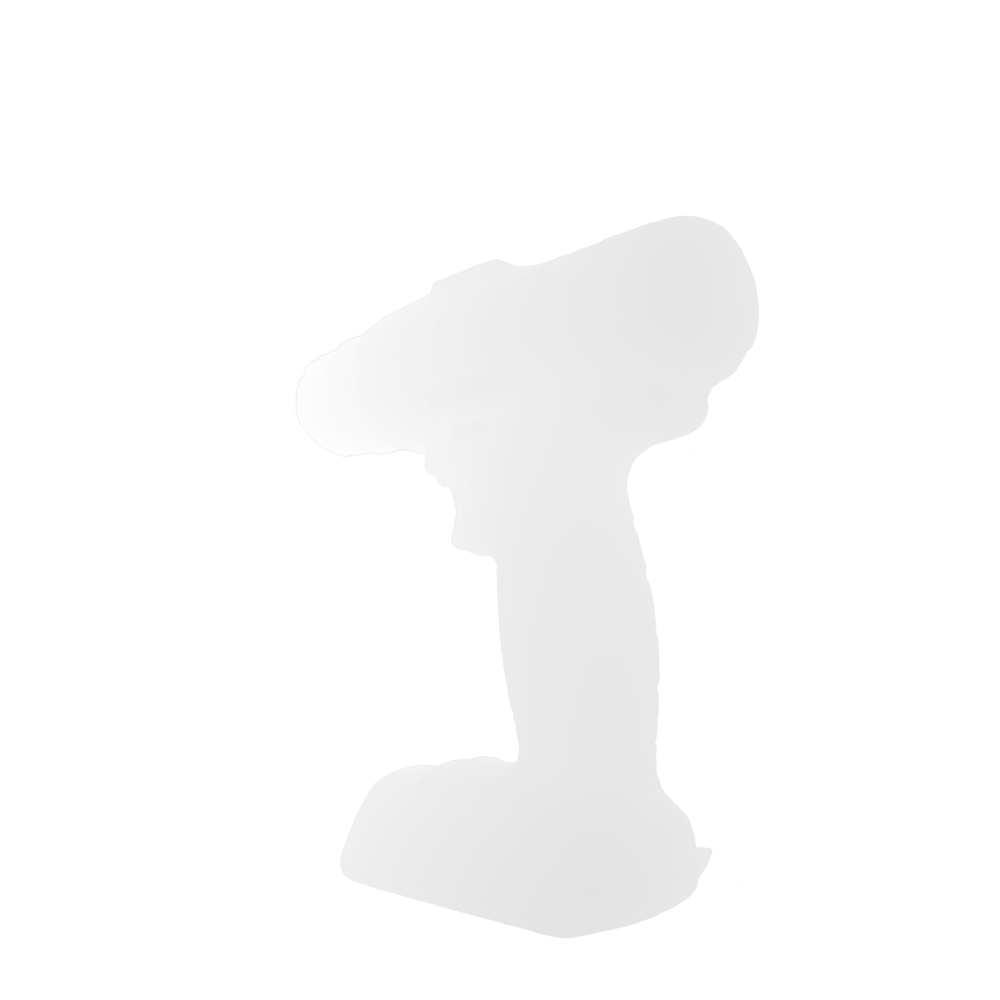

In [79]:
from PIL import Image
Image.fromarray(np.array(255*nerf_depth_img/np.max(nerf_depth_img), dtype=np.uint8))

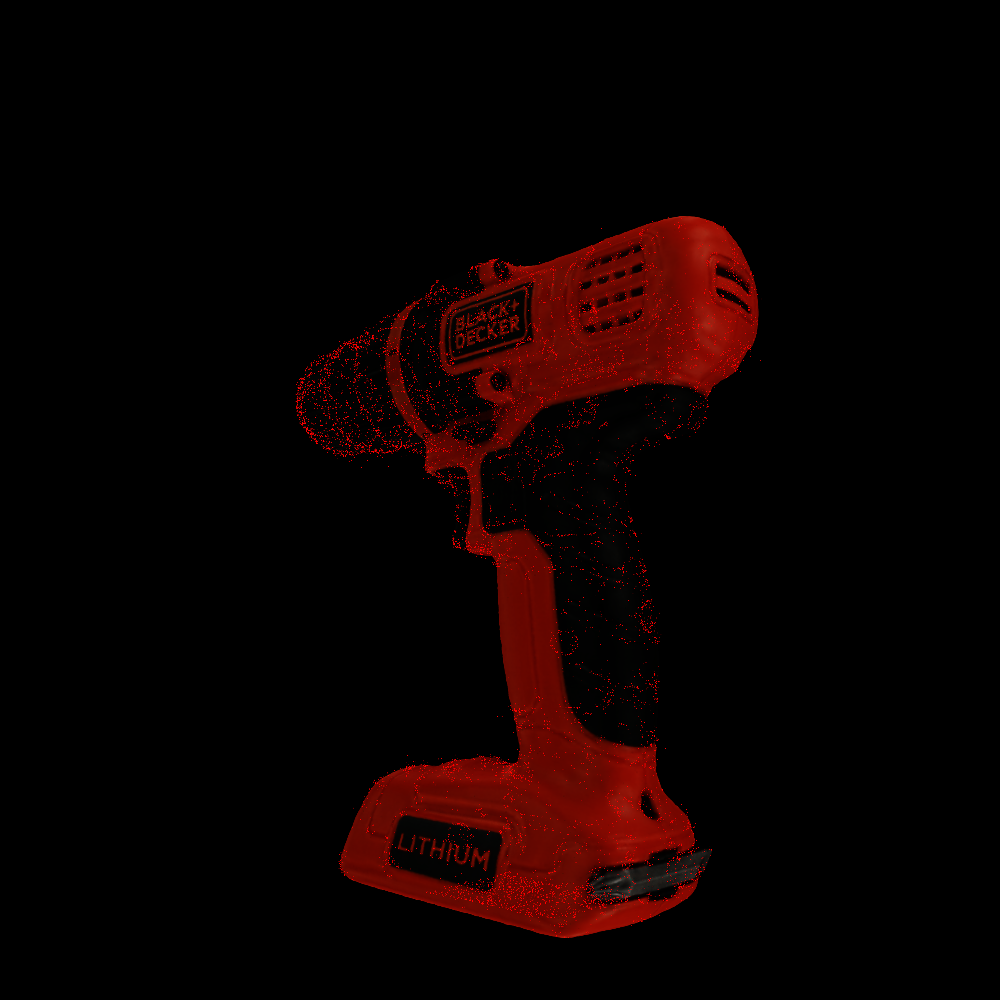

In [205]:
Image.fromarray(np.array(nerf_rgb_img_c, dtype=np.uint8))

In [23]:
np.max(nerf_depth_img)

3.917865

In [24]:
np.max(nerf_depth_img)

3.917865

In [25]:
go.Scatter3d(
    x=points3d_in_sfm_camera_frame[:, 2], y=points3d_in_sfm_camera_frame[:, 0], z=points3d_in_sfm_camera_frame[:, 1],
    mode='markers', marker=dict(
        size=2,
        colorscale='darkmint',   # choose a colorscale
        opacity=0.8
    )

SyntaxError: unexpected EOF while parsing (2134669483.py, line 7)

In [298]:
cx, cy

(1512.0, 2016.0)

In [52]:
nerf_depth_img

array([[[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]],

       [[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]],

       [[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]],

       ...,

       [[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]],

       [[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]],

       [[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        ...,
        [1., 1., 1., 1.],
        [1., 1.

In [295]:
nerf_depth_img / 2

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0.

In [299]:
pts_in_image


(tensor([[1550.8363,  192.7979],
         [1526.0992,  202.3084],
         [1555.9212,  215.1198],
         ...,
         [1707.9242,  427.2821],
         [1549.5042,  334.2592],
         [1896.9167,  401.6012]], dtype=torch.float64),
 tensor([True, True, True,  ..., True, True, True]))

In [92]:
import cv2

In [94]:
pt

array([1104.82239611, 1050.32370107])